In [20]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
from shapely import wkt
import geopandas as gpd
from shapely.geometry import Point
import seaborn as sns
from branca.colormap import LinearColormap
import plotly.graph_objects as go
import ast

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="joblib")

## Prepare data

In [21]:
pois = pd.read_csv('originais/AML_POIS_GOOGLE_API_HOURS_no_estbl.csv', delimiter=';')
clients = pd.read_csv('originais/stops_30clients.csv', delimiter=';')
freguesias = pd.read_csv('originais/Freguesias_boundaries.csv', delimiter=';')
crimes_info = pd.read_csv('originais/crimes_freguesias_boundaries.csv', delimiter=';')
nivel_crimes = pd.read_csv('originais/crimes_com_nivel.csv', delimiter=';')

nivel_crimes = nivel_crimes[['Crime', 'Nivel_gravidade']]
nivel_crimes = nivel_crimes.drop_duplicates()

crimes = crimes_info.rename(columns={'Macro_type': 'Crime'})
crimes = crimes.merge(nivel_crimes, on='Crime', how='left')

# ignore pois that have macro_category_name lodging
pois = pois[pois['macro_category_name'] != 'Lodging']

In [22]:
pois['macro_category_name'].unique()

array(['food_drinks_cafe', 'beauty_care', 'storage', 'school', 'store',
       'lodging', 'car_repair', 'church', 'florist', 'locality', 'health',
       'travel_agency', 'stadium', 'transit_station',
       'tourist_attraction', 'grocery_or_supermarket',
       'art_gallery_museum', 'veterinary_care', 'local_government_office',
       'gym', 'car_dealer', 'neighborhood', 'locksmith', 'car_wash',
       'parking', 'university', 'contractor', 'real_estate_agency',
       'campground', 'shopping_mall', 'train_station',
       'meal_delivery_takeway', 'pharmacy', 'police', 'airport',
       'fire_station', 'library', 'finance', 'cemetery', 'amusement_park',
       'night_club', 'moving_company', 'post_office', 'painter',
       'insurance_agency', 'courthouse', 'electrician',
       'place_of_worship', 'laundry', 'gas_station', 'atm', 'dentist',
       'sublocality_level_1', 'movie_theater', 'aquarium', 'casino',
       'funeral_home', 'bus_station', 'city_hall', 'lawyer', 'bank',
       

In [23]:
crimes_gdf = gpd.GeoDataFrame(
    crimes,
    geometry=gpd.GeoSeries.from_wkt(crimes["geometry"]),
    crs="EPSG:4326",
)

pois_gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(pois['espec_fld_longitude'], pois['espec_fld_latitude']),
    crs="EPSG:4326",
)

clients['id'] = clients.index
clients_gdf = gpd.GeoDataFrame(
    clients,
    geometry=gpd.points_from_xy(clients['VAL_LONGITUDE'], clients['VAL_LATITUDE']),
    crs="EPSG:4326",
)

# Union of all crime areas
crime_areas = crimes_gdf.union_all()

# Only keep those within crime areas
pois_filtered = pois_gdf[pois_gdf.geometry.within(crime_areas)].copy()
clients_filtered = clients_gdf[clients_gdf.geometry.within(crime_areas)].copy()

# To save on which dicofre each point is located
pois_filtered['Dicofre'] = pois_filtered.geometry.apply(
    lambda point: crimes_gdf[crimes_gdf.geometry.contains(point)]['Dicofre'].values[0] 
    if any(crimes_gdf.geometry.contains(point)) else None
)

clients_filtered['Dicofre'] = clients_filtered.geometry.apply(
    lambda point: crimes_gdf[crimes_gdf.geometry.contains(point)]['Dicofre'].values[0] 
    if any(crimes_gdf.geometry.contains(point)) else None
)

# Now use these filtered datasets for mapping
print(f"Original POIs: {len(pois_gdf)}, Filtered: {len(pois_filtered)}")
print(f"Original Clients: {len(clients_gdf)}, Filtered: {len(clients_filtered)}")

Original POIs: 21831, Filtered: 1030
Original Clients: 12794, Filtered: 6495


## Maps for Crimes, POIs and Clients

### Crimes

In [42]:
# Create map
m = folium.Map(location=[38.7169, -9.1399], zoom_start=13)

# Create clusters
crime_cluster = MarkerCluster(name="Crimes").add_to(m)

# Add Crimes
for _, row in crimes.iterrows():
    folium.Marker(
        location=[row.latitude, row.longitude],
        popup=f"Freguesia: {row.get('Freguesia', 'N/A')}, Crime: {row.get('Crime', 'N/A')}",
        icon=folium.Icon(
            color="red"
        )
    ).add_to(crime_cluster)

# Add layer control
folium.LayerControl().add_to(m)

m

### POIs

In [25]:
def parse_hours(hour_str):
    try:
        hours = ast.literal_eval(hour_str)
        return [[int(x) for x in inner] for inner in hours]
    except:
        return [[0, 0], [0, 0]]

def is_open_at_hour(hours, target_hour):
    """Check if business is open at target_hour (weekdays)"""
    if len(hours) == 0 or len(hours[0]) < 2:
        return False
    
    open_hour, close_hour = hours[0][0], hours[0][1]
    
    # Normal case: open_hour < close_hour (e.g., 9-17)
    if open_hour < close_hour:
        return open_hour <= target_hour < close_hour
    # Overnight case: close_hour < open_hour (e.g., 7-2)
    else:
        return target_hour >= open_hour or target_hour < close_hour

pois_filtered['parsed_hours'] = pois_filtered['hours'].apply(parse_hours)

# Create figure with slider
fig = go.Figure()

# Add initial heatmap
fig.add_trace(
    go.Densitymap(
        lat=pois_filtered.espec_fld_latitude,
        lon=pois_filtered.espec_fld_longitude,
        radius=10,
        opacity=0.8,
        visible=True,
        name="POIs"
    )
)

# Update layout
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_center_lat=38.7169,
    mapbox_center_lon=-9.1399,
    mapbox_zoom=13,
    title='POIs Heatmap in Lisbon - Filter by Weekday Opening Hours',
    width=800,
    height=600,
    sliders=[{
        'active': 0,
        'currentvalue': {'prefix': 'Hour: '},
        'steps': [],
    }]
)

# Create slider steps for each hour
steps = []
for hour in range(24):
    mask = pois_filtered['parsed_hours'].apply(
        lambda x: is_open_at_hour(x, hour)
    )
    
    filtered_data = pois_filtered[mask]
    
    step = {
        'method': 'update',
        'label': str(hour),
        'args': [
            {
                'lat': [filtered_data.espec_fld_latitude],
                'lon': [filtered_data.espec_fld_longitude],
                'z': [np.ones(len(filtered_data))]
            },
            {'title': f'POIs open at {hour}:00 (Weekdays)'}
        ]
    }
    steps.append(step)

fig.update_layout(
    sliders=[{
        'active': 0,
        'currentvalue': {'prefix': 'Hour: '},
        'steps': steps,
        'len': 0.9,
        'x': 0.1,
        'y': 0,
        'tickcolor': 'white'
    }]
)

fig.show(config={
    'scrollZoom': True,
    'displayModeBar': False
})

### Clients

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime

# Convert to numeric hour if needed
clients_filtered["COD_HORA"] = pd.to_numeric(
    clients_filtered["COD_HORA"], errors="coerce"
)

# Create base figure
fig = go.Figure()

# Add initial heatmap (all hours)
fig.add_trace(
    go.Densitymapbox(
        lat=clients_filtered["VAL_LATITUDE"],
        lon=clients_filtered["VAL_LONGITUDE"],
        z=np.ones(len(clients_filtered)),  # Uniform weight
        radius=15,
        opacity=0.8,
        colorscale="Blues",
        name="Client Density",
        visible=True,
    )
)

# Create slider steps for each hour
steps = []
for hour in range(24):
    hour_data = clients_filtered[clients_filtered["COD_HORA"] == hour]

    step = dict(
        method="update",
        args=[
            {
                "lat": [hour_data["VAL_LATITUDE"]],
                "lon": [hour_data["VAL_LONGITUDE"]],
                "z": [np.ones(len(hour_data))],
            }
        ],
        label=f"{hour:02d}:00",
    )
    steps.append(step)

# Update layout to match your style
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_center={"lat": 38.7169, "lon": -9.1399},
    mapbox_zoom=13,
    title="Client Activity Heatmap by Hour",
    width=800,
    height=600,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
    sliders=[
        {
            "active": 12,  # Default to noon
            "currentvalue": {"prefix": "Hour: "},
            "steps": steps,
            "len": 0.9,
            "x": 0.1,
            "y": 0,
        }
    ],
)

# Add optional parish boundaries (if available)
# fig.add_trace(go.Choroplethmapbox(...))

fig.show(config={"scrollZoom": True, "displayModeBar": False})

In [48]:
# Create map
m = folium.Map(location=[38.7169, -9.1399], zoom_start=13)

# Create clusters
client_cluster = MarkerCluster(name="Clients").add_to(m)

# Add filtered Clients
for _, row in clients_filtered.iterrows():
    folium.Marker(
        location=[row.VAL_LATITUDE, row.VAL_LONGITUDE],
        popup=f"Client: {row.get('CELLID', 'N/A')}",
        icon=folium.Icon(color="blue", icon="user")
    ).add_to(client_cluster)

# Add layer control
folium.LayerControl().add_to(m)

m

## Counts of POI, Clients and Crimes on each Parish

In [27]:
# 2. Count crimes per Dicofre (assuming crimes_gdf has 'Dicofre' column)
crime_counts = crimes_gdf['Dicofre'].value_counts().rename('crime_count').to_frame()

# Add gravity sum per Dicofre
gravity_sum = crimes_gdf.groupby('Dicofre')['Nivel_gravidade'].sum().rename('gravity_sum')

# 3. Count POIs per Dicofre
pois_per_dicofre = gpd.sjoin(pois_gdf, crimes_gdf[['Dicofre', 'geometry', 'Freguesia']], 
                           predicate='within', how='left')
poi_counts = pois_per_dicofre['Dicofre'].value_counts().rename('poi_count')

# 4. Count clients per Dicofre
clients_per_dicofre = gpd.sjoin(clients_gdf, crimes_gdf[['Dicofre', 'geometry', 'Freguesia']],
                              predicate='within', how='left')
client_counts = clients_per_dicofre['Dicofre'].value_counts().rename('client_count')

# 5. Combine all counts into one DataFrame
counts_df = pd.concat([crime_counts, gravity_sum, poi_counts, client_counts], axis=1).fillna(0)

# Add geometry and Freguesia information from crimes_gdf
# We take the first occurrence's geometry and Freguesia for each Dicofre
geo_freg = crimes_gdf.drop_duplicates('Dicofre').set_index('Dicofre')[['geometry', 'Freguesia']]
counts_df = counts_df.join(geo_freg)

# Reset index to make Dicofre a column
counts_df = counts_df.reset_index().rename(columns={'index': 'Dicofre'})

# Convert counts to integers
counts_df = counts_df.astype({
    'crime_count': int,
    'gravity_sum': int,
    'poi_count': int, 
    'client_count': int
})

# Sort by crime count (descending)
counts_df = counts_df.sort_values('crime_count', ascending=False)

print(counts_df)

     Dicofre  crime_count  gravity_sum  poi_count  client_count  \
0   110665.0           38          138       2812         13452   
1   110655.0           20           69        440           900   
2   110661.0           18           65        756          2052   
3   110654.0           17           68       1156          6137   
4   110656.0           15           52        720          3420   
5   110639.0           12           51        600          4104   
6   110662.0           12           41        648          1284   
7   110633.0           11           37        671          7733   
8   110657.0           10           37        480          2200   
9   110667.0            9           32        243          1449   
10  110611.0            8           35        248          1656   
11  110666.0            8           30        320           936   
12  110660.0            8           32        280          1496   
13  110608.0            7           26        581          527

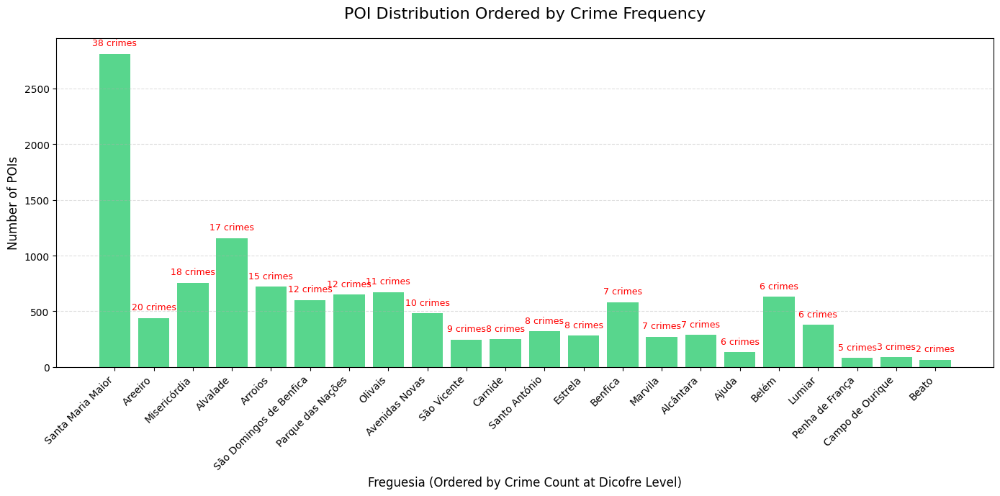

In [28]:
# 1. Get crime counts per Dicofre (sorted)
crime_counts_by_dicofre = crimes_gdf['Dicofre'].value_counts().sort_values(ascending=False)

# 2. Get Freguesia names for each Dicofre
dicofre_to_freguesia = crimes_gdf.drop_duplicates('Dicofre').set_index('Dicofre')['Freguesia']

# 3. Get POI counts per Dicofre (using same order)
poi_counts_by_dicofre = pois_per_dicofre['Dicofre'].value_counts()
poi_counts_ordered = poi_counts_by_dicofre.reindex(crime_counts_by_dicofre.index).fillna(0)

# 4. Convert Dicofre index to Freguesia names for plotting
freguesia_names = [dicofre_to_freguesia[dicofre] for dicofre in crime_counts_by_dicofre.index]

# 5. Create the plot
plt.figure(figsize=(14, 7))
bars = plt.bar(
    freguesia_names,
    poi_counts_ordered.values,
    color='#2ecc71',  # Green color for POIs
    alpha=0.8
)

# 6. Add crime count labels (using original crime counts)
for i, (poi_count, crime_count) in enumerate(zip(poi_counts_ordered.values, crime_counts_by_dicofre.values)):
    plt.text(
        i, 
        poi_count + max(poi_counts_ordered.values)*0.02,
        f'{int(crime_count)} crimes',
        ha='center', 
        va='bottom',
        fontsize=9,
        color='red'
    )

# 7. Customizations
plt.title('POI Distribution Ordered by Crime Frequency', fontsize=16, pad=20)
plt.xlabel('Freguesia (Ordered by Crime Count at Dicofre Level)', fontsize=12)
plt.ylabel('Number of POIs', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

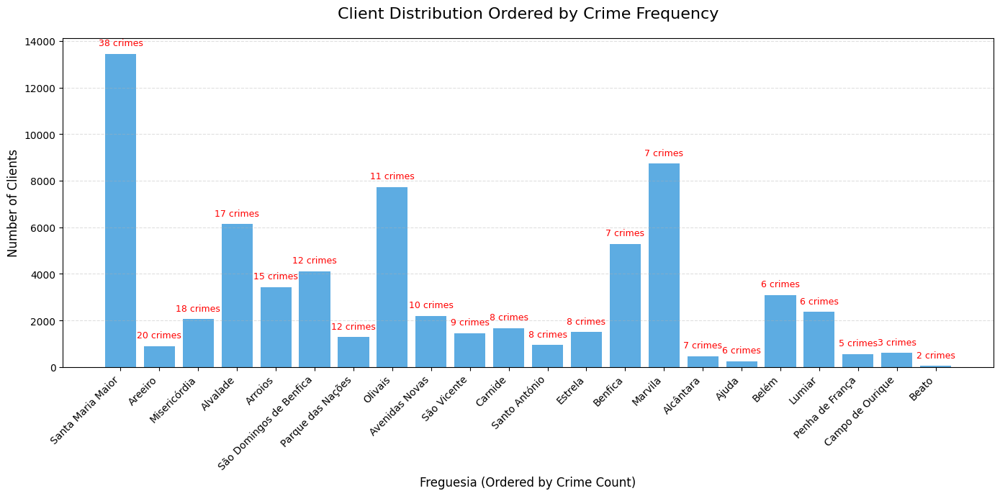

In [29]:
# 1. First create a Dicofre-Freguesia mapping dictionary
freguesia_mapping = crimes_gdf.drop_duplicates('Dicofre').set_index('Dicofre')['Freguesia'].to_dict()

# 2. Get crime counts per Freguesia (sorted)
crime_counts = crimes_gdf['Freguesia'].value_counts().sort_values(ascending=False)

# 3. Get client counts per Freguesia (using same order)
client_counts = clients_per_dicofre['Dicofre'].map(freguesia_mapping).value_counts()
client_counts_ordered = client_counts.reindex(crime_counts.index).fillna(0)

# 4. Create the plot
plt.figure(figsize=(14, 7))
bars = plt.bar(
    client_counts_ordered.index,
    client_counts_ordered.values,
    color='#3498db',  # Blue color for clients
    alpha=0.8
)

# 5. Customizations
plt.title('Client Distribution Ordered by Crime Frequency', fontsize=16, pad=20)
plt.xlabel('Freguesia (Ordered by Crime Count)', fontsize=12)
plt.ylabel('Number of Clients', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.4)

# 6. Add crime count labels on top
for i, (client_count, crime_count) in enumerate(zip(client_counts_ordered.values, crime_counts.values)):
    plt.text(
        i, 
        client_count + max(client_counts_ordered.values)*0.02,
        f'{int(crime_count)} crimes',
        ha='center', 
        va='bottom',
        fontsize=9,
        color='red'
    )

plt.tight_layout()
plt.show()

## Clusters

### Elbow Method

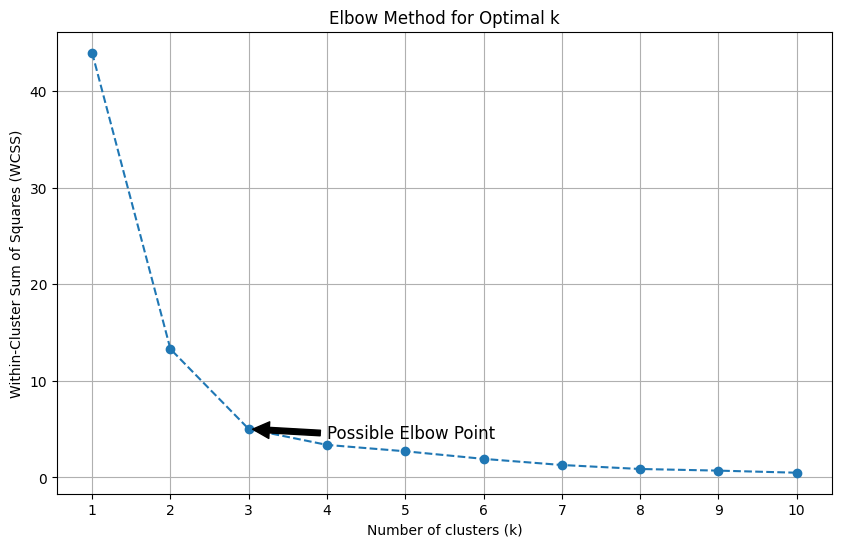

In [30]:
# Assuming counts_df is your DataFrame
# Select the relevant columns
X = counts_df[['gravity_sum', 'poi_count']]

# Standardize the data (important when variables are on different scales)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Calculate WCSS (Within-Cluster Sum of Squares) for different k values
wcss = []
max_clusters = 10  # Testing up to 10 clusters

for k in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters+1), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(np.arange(1, max_clusters+1, 1))
plt.grid(True)

# Highlight the "elbow point" (you'll need to visually identify this)
plt.annotate('Possible Elbow Point', 
             xy=(3, wcss[2]), 
             xytext=(4, wcss[3]*1.2),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12)

plt.show()

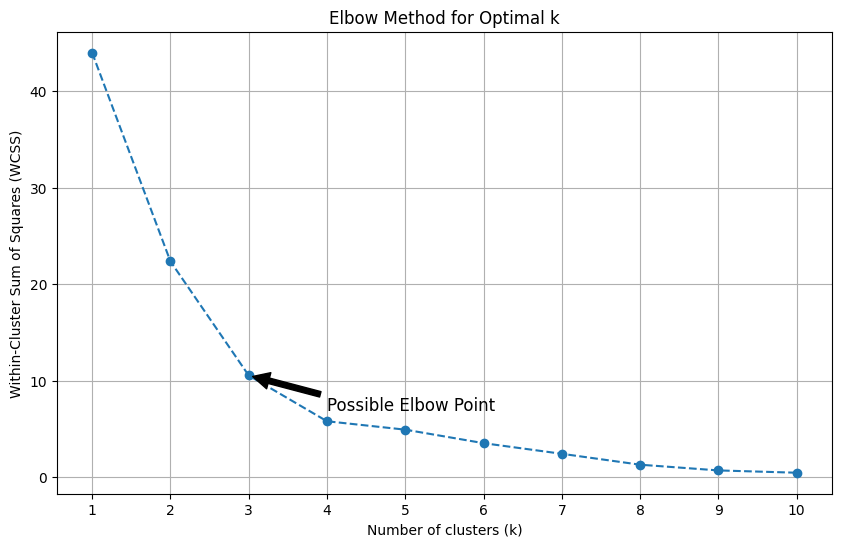

In [31]:
# Assuming counts_df is your DataFrame
# Select the relevant columns
X = counts_df[['gravity_sum', 'client_count']]

# Standardize the data (important when variables are on different scales)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Calculate WCSS (Within-Cluster Sum of Squares) for different k values
wcss = []
max_clusters = 10  # Testing up to 10 clusters

for k in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters+1), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(np.arange(1, max_clusters+1, 1))
plt.grid(True)

# Highlight the "elbow point" (you'll need to visually identify this)
plt.annotate('Possible Elbow Point', 
             xy=(3, wcss[2]), 
             xytext=(4, wcss[3]*1.2),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12)

plt.show()

### K-means (Crimes vs. POI)

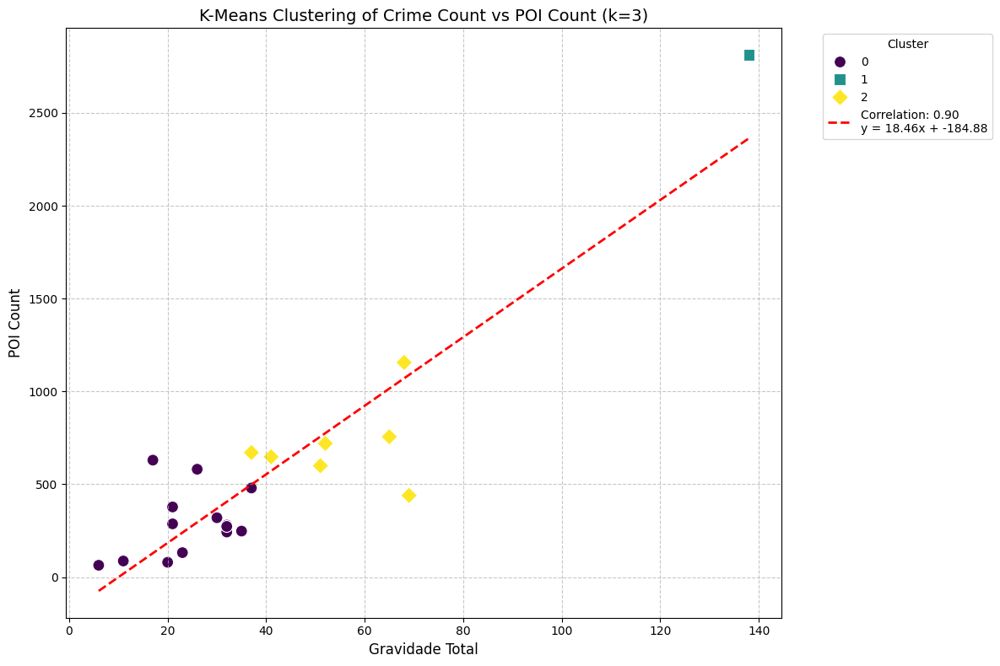


Cluster Statistics:

Cluster 0:
Number of points: 14
Mean Nivel Gravidade: 6.57
Mean POI count: 291.64

Cluster 1:
Number of points: 1
Mean Nivel Gravidade: 38.00
Mean POI count: 2812.00

Cluster 2:
Number of points: 7
Mean Nivel Gravidade: 15.00
Mean POI count: 713.00


In [32]:
# Load your data (assuming counts_df is already loaded)
X = counts_df[['gravity_sum', 'poi_count']]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-Means with 3 clusters
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to original dataframe
counts_df['cluster'] = clusters

# Get cluster centers in original scale
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)

# Calculate correlation and regression line
correlation = counts_df['gravity_sum'].corr(counts_df['poi_count'])
slope, intercept = np.polyfit(counts_df['gravity_sum'], counts_df['poi_count'], 1)

# Create a beautiful visualization
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(
    data=counts_df, 
    x='gravity_sum', 
    y='poi_count', 
    hue='cluster', 
    palette='viridis', 
    s=100,
    style='cluster',
    markers=['o', 's', 'D']
)

# Add correlation line
line_x = np.linspace(counts_df['gravity_sum'].min(), counts_df['gravity_sum'].max(), 100)
line_y = slope * line_x + intercept
plt.plot(line_x, line_y, color='red', linestyle='--', linewidth=2, 
         label=f'Correlation: {correlation:.2f}\ny = {slope:.2f}x + {intercept:.2f}')

# Add labels and title
plt.title('K-Means Clustering of Crime Count vs POI Count (k=3)', fontsize=14)
plt.xlabel('Gravidade Total', fontsize=12)
plt.ylabel('POI Count', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()

# Print cluster statistics
print("\nCluster Statistics:")
print("==================")
for cluster_num in range(3):
    cluster_data = counts_df[counts_df['cluster'] == cluster_num]
    print(f"\nCluster {cluster_num}:")
    print(f"Number of points: {len(cluster_data)}")
    print(f"Mean Nivel Gravidade: {cluster_data['crime_count'].mean():.2f}")
    print(f"Mean POI count: {cluster_data['poi_count'].mean():.2f}")

In [33]:
# Create a custom colormap for 3 clusters using Viridis-like colors
colors = ['#440154', '#21918c', '#fde725']  # Viridis color scheme for 3 classes
colormap = LinearColormap(
    colors=colors,
    vmin=counts_df['cluster'].min(),
    vmax=counts_df['cluster'].max()
)

# Convert CRS to WGS84 (latitude/longitude) for Folium
counts_gdf = gpd.GeoDataFrame(counts_df, geometry='geometry')
counts_gdf = counts_gdf.to_crs(epsg=4326)

# Calculate the center of the map
avg_lat = counts_gdf.geometry.centroid.y.mean()
avg_lon = counts_gdf.geometry.centroid.x.mean()

# Create the map
m = folium.Map(
    location=[avg_lat, avg_lon], 
    zoom_start=12, 
    tiles='CartoDB positron',)

# Add each parish to the map with cluster coloring
for _, row in counts_gdf.iterrows():
    # Get the color for this cluster
    cluster_color = colors[int(row['cluster'])]
    
    # Create a popup with information
    popup_text = f"""
    <strong>Freguesia:</strong> {row['Freguesia']}<br>
    <strong>Dicofre:</strong> {row['Dicofre']}<br>
    <strong>Cluster:</strong> {row['cluster']}<br>
    <strong>Gravidade Total:</strong> {row['gravity_sum']}<br>
    <strong>POI Count:</strong> {row['poi_count']}<br>
    <strong>Client Count:</strong> {row['client_count']}
    """
    
    # Add the parish to the map
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, color=cluster_color: {
            'fillColor': color,
            'color': 'black',
            'weight': 0.5,
            'fillOpacity': 0.7
        },
        tooltip=popup_text
    ).add_to(m)

# Add the colormap to the map
colormap.caption = 'Cluster Distribution'
colormap.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
display(m)

C:\Users\emanu\AppData\Local\Temp\ipykernel_155516\3917508695.py:14: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\emanu\AppData\Local\Temp\ipykernel_155516\3917508695.py:15: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.






#### Cluster Characteristics

**Cluster Purple: Low-Moderate Areas**  
- Size: 14 locations (63.6% of data)  
- Mean Nivel Gravidade: 6.57 (low)
- POI count: 291.64 (moderate)  
- Interpretation: Baseline urban zones  

**Cluster Green/Teal: Extreme High-Activity Area**  
- Size: 1 location (4.5% of data)  
- Mean Nivel Gravidade: 38.00 (Very High)
- POI count: 2812.00 (extremely high)  
- Interpretation: Central business district or special case  

**Cluster Yellow: Elevated-Activity Areas**  
- Size: 7 locations (31.8% of data)  
- Mean Nivel Gravidade: 15.00 (Moderate)  
- POI count: 713.00 (high)  
- Interpretation: Commercial hotspots

#### Key Observations:
1. The dataset shows three distinct activity tiers  
2. Crime and POI counts scale together (R = 0.92 correlation)  
3. The single-point cluster represents a statistically distinct case  
4. 31.8% of locations show elevated activity levels

### K-Means (Crimes vs. Clients)

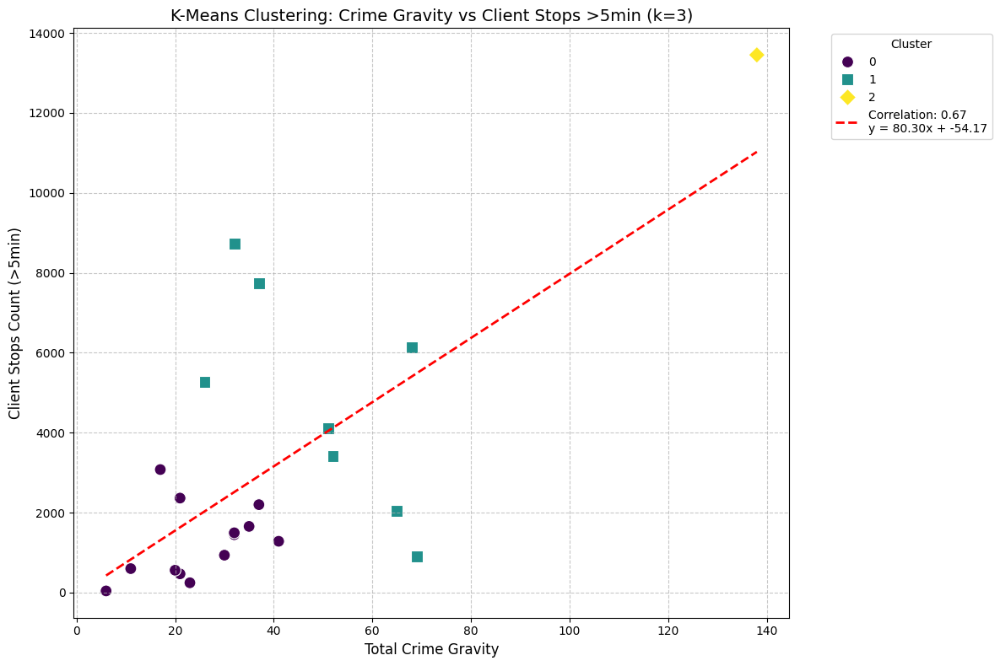


Cluster Statistics:

Cluster 0:
Number of points: 13
Mean Crime Gravity: 25.08
Mean Client Stops (>5min): 1260.00

Cluster 1:
Number of points: 8
Mean Crime Gravity: 50.00
Mean Client Stops (>5min): 4794.12

Cluster 2:
Number of points: 1
Mean Crime Gravity: 138.00
Mean Client Stops (>5min): 13452.00


In [34]:
# Load your data (assuming counts_df is already loaded)
X = counts_df[['gravity_sum', 'client_count']]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-Means with 3 clusters
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to original dataframe
counts_df['cluster'] = clusters

# Get cluster centers in original scale
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)

# Calculate correlation and regression line
correlation = counts_df['gravity_sum'].corr(counts_df['client_count'])
slope, intercept = np.polyfit(counts_df['gravity_sum'], counts_df['client_count'], 1)

# Create a beautiful visualization
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(
    data=counts_df, 
    x='gravity_sum', 
    y='client_count', 
    hue='cluster', 
    palette='viridis', 
    s=100,
    style='cluster',
    markers=['o', 's', 'D']
)

# Add correlation line
line_x = np.linspace(counts_df['gravity_sum'].min(), counts_df['gravity_sum'].max(), 100)
line_y = slope * line_x + intercept
plt.plot(line_x, line_y, color='red', linestyle='--', linewidth=2, 
         label=f'Correlation: {correlation:.2f}\ny = {slope:.2f}x + {intercept:.2f}')

# Add labels and title
plt.title('K-Means Clustering: Crime Gravity vs Client Stops >5min (k=3)', fontsize=14)
plt.xlabel('Total Crime Gravity', fontsize=12)
plt.ylabel('Client Stops Count (>5min)', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()

# Print cluster statistics
print("\nCluster Statistics:")
print("==================")
for cluster_num in range(3):
    cluster_data = counts_df[counts_df['cluster'] == cluster_num]
    print(f"\nCluster {cluster_num}:")
    print(f"Number of points: {len(cluster_data)}")
    print(f"Mean Crime Gravity: {cluster_data['gravity_sum'].mean():.2f}")
    print(f"Mean Client Stops (>5min): {cluster_data['client_count'].mean():.2f}")

In [35]:
# Create a custom colormap for 3 clusters using Viridis-like colors
colors = ['#440154', '#21918c', '#fde725']  # Viridis color scheme for 3 classes
colormap = LinearColormap(
    colors=colors,
    vmin=counts_df['cluster'].min(),
    vmax=counts_df['cluster'].max()
)

# Convert CRS to WGS84 (latitude/longitude) for Folium
counts_gdf = gpd.GeoDataFrame(counts_df, geometry='geometry')
counts_gdf = counts_gdf.to_crs(epsg=4326)

# Calculate the center of the map
avg_lat = counts_gdf.geometry.centroid.y.mean()
avg_lon = counts_gdf.geometry.centroid.x.mean()

# Create the map with smaller dimensions
m = folium.Map(
    location=[avg_lat, avg_lon], 
    zoom_start=12, 
    tiles='CartoDB positron'
)

# Add each parish to the map with cluster coloring
for _, row in counts_gdf.iterrows():
    # Get the color for this cluster
    cluster_color = colors[int(row['cluster'])]
    
    # Create a popup with corrected information
    popup_text = f"""
    <strong>Freguesia:</strong> {row['Freguesia']}<br>
    <strong>Dicofre:</strong> {row['Dicofre']}<br>
    <strong>Cluster:</strong> {row['cluster']}<br>
    <strong>Total Crime Gravity:</strong> {row['gravity_sum']:.2f}<br>
    <strong>POI Count:</strong> {row['poi_count']}<br>
    <strong>Client Stops (>5min):</strong> {row['client_count']}
    """
    
    # Add the parish to the map
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, color=cluster_color: {
            'fillColor': color,
            'color': 'black',
            'weight': 0.5,
            'fillOpacity': 0.7
        },
        tooltip=folium.Tooltip(popup_text)  # Using Tooltip for better formatting
    ).add_to(m)

# Add the colormap to the map
colormap.caption = 'Crime Gravity vs Client Stops Clusters'
colormap.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map with HTML wrapper for better size control
display(m)

C:\Users\emanu\AppData\Local\Temp\ipykernel_155516\2786657266.py:14: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\emanu\AppData\Local\Temp\ipykernel_155516\2786657266.py:15: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




#### Cluster Characteristics

**Cluster Purple: Low-Risk Areas**  
- Locations: 13 (59% of total)  
- Avg. Crime Gravity: 25.08 (Low)  
- Avg. Client Stops: 1260.00
- Profile: Stable residential/commercial mix  

**Cluster Green/Teal: Medium-Risk Zones**  
- Locations: 8 (36% of total)  
- Avg. Crime Gravity: 50.00 (Moderate)  
- Avg. Client Stops: 4794.12  
- Profile: Busy commercial districts  

**Cluster Yellow: High-Risk Zones**  
- Locations: 1 (5% of total)  
- Avg. Crime Gravity: 138.00 (High)  
- Avg. Client Stops: 13452.00  
- Profile: Major commercial hub

#### Key Patterns

1. **Activity Scaling**  
   - Client counts grow faster than crime severity  
   - 9x more clients → only 5.5x more crime gravity  

2. **Risk Ratios**  
   - Gravity-per-100-clients decreases with size:  
     - Cluster 0: 2.32  
     - Cluster 1: 2.06  
     - Cluster 2: 1.35  

3. **Distribution**  
   - Most areas (59%) are low-risk  
   - Single extreme outlier dominates statistics  